## Import and analyze data

In [ ]:
# To access Google Drive files
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import torch
import torchvision
import numpy as np
from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader, ConcatDataset
import sys
import os
from torchvision import datasets, transforms, models
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import time
import matplotlib.pyplot as plt
import PIL
from tqdm.notebook import tqdm
from IPython.display import Image

%matplotlib inline

In [ ]:
# on lit une première fois les images du dataset
image_directory = "/content/drive/My Drive/DLPokemon/GAN_DATA"

In [ ]:
## FORMER pre-processing (not used anymore)

image_size = 64
batch_size = 32
normalization = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

data_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*normalization)
])

data_transforms_2 = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.RandomHorizontalFlip(p=1.0),
    transforms.ToTensor(),
    transforms.Normalize(*normalization)
])

data_transforms_3 = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ColorJitter(hue=.05, saturation=.05),
    transforms.ToTensor(),
    transforms.Normalize(*normalization)
])

data_transforms_4 = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.RandomAffine(30, translate=None, fillcolor=255),
    transforms.ToTensor(),
    transforms.Normalize(*normalization)
])

data_transforms_5 = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.RandomAffine(0, translate=(0.15, 0), fillcolor=255),
    transforms.ToTensor(),
    transforms.Normalize(*normalization)
])

data_transforms_6 = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.RandomAffine(0, translate=(0, 0.15), fillcolor=255),
    transforms.ToTensor(),
    transforms.Normalize(*normalization)
])

data_transforms_7 = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.RandomAffine(0, translate=(0.15, 0.15), fillcolor=255),
    transforms.ToTensor(),
    transforms.Normalize(*normalization)
])

dataset_1 = datasets.ImageFolder(image_directory, data_transforms)
dataset_2 = datasets.ImageFolder(image_directory, data_transforms_2)
dataset_3 = datasets.ImageFolder(image_directory, data_transforms_3)
dataset_4 = datasets.ImageFolder(image_directory, data_transforms_4)
dataset_5 = datasets.ImageFolder(image_directory, data_transforms_5)
dataset_6 = datasets.ImageFolder(image_directory, data_transforms_6)
dataset_7 = datasets.ImageFolder(image_directory, data_transforms_7)

# Combine the datasets
dataset_list = [dataset_1, dataset_2, dataset_3, dataset_4, dataset_5, dataset_6, dataset_7]
dataset = ConcatDataset(dataset_list)

dataloader = DataLoader(dataset, batch_size, shuffle=True)

In [ ]:
## CORRECT pre-processing

image_size = 64
batch_size = 32
normalization = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

data_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.RandomAffine(0, translate=(5/image_size, 5/image_size), fillcolor=(0,0,0)),
    transforms.ColorJitter(hue=0.2),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(*normalization)
])

dataset = datasets.ImageFolder(image_directory, data_transforms)

dataloader = DataLoader(dataset, batch_size, shuffle=True)

In [ ]:
def denorm(image):
    return image*normalization[1][0] + normalization[0][0]

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))
    
def show_batch(dataloader, nmax=64):
    for images, _ in dataloader:
        show_images(images, nmax)
        break

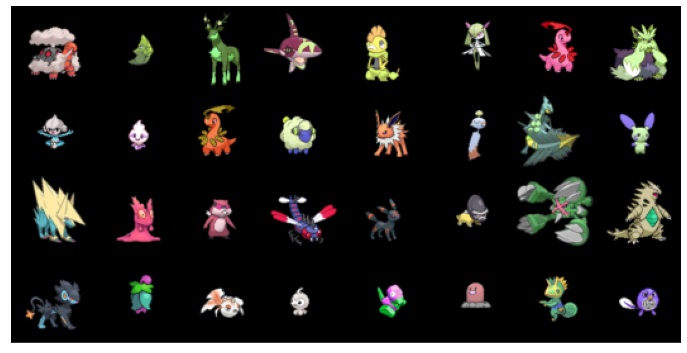

In [ ]:
show_batch(dataloader)

In [ ]:
len(dataset)

2813

In [ ]:
# on utilisera le GPU (beaucoup plus rapide) si disponible, sinon on utilisera le CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#device = torch.device("cpu") # forcer en CPU s'il y a des problèmes de mémoire GPU (+ être patient...)
print(device)

cuda:0


## Discriminator

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
ndf = 64 # size of feature maps in discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.l1 = nn.Sequential(
            # input is 3 x 64 x 64
            nn.Conv2d(3, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True))
            # state size. (ndf) x 32 x 32
        self.l2 = nn.Sequential(
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True))
            # state size. (ndf*2) x 16 x 16
        self.l3 = nn.Sequential(
            nn.Conv2d(ndf*2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True))
            # state size. (ndf*4) x 8 x 8
        self.l4 = nn.Sequential(
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True))
            # state size. (ndf*8) x 4 x 4
        self.l5 = nn.Sequential(
            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid())

    def forward(self, input):
        rv = torch.randn(input.size(), device=device) * 0.02
        h = input + rv
        h = self.l1(h)
        rv = torch.randn(h.size(), device=device) * 0.02 + 1
        h = h*rv
        h = self.l2(h)
        rv = torch.randn(h.size(), device=device) * 0.02 + 1
        h = h*rv
        h = self.l3(h)
        rv = torch.randn(h.size(), device=device) * 0.02 + 1
        h = h*rv
        h = self.l4(h)
        rv = torch.randn(h.size(), device=device) * 0.02 + 1
        h = h*rv
        h = self.l5(h)
        return (h).view(-1)

In [ ]:
discriminator = Discriminator().to(device)
discriminator.apply(weights_init)

Discriminator(
  (l1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (l2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (l3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (l4): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (l5): Sequential(
    (0): Conv2d(512, 1, kernel_size

## Generator

In [ ]:
latent_size = 16
ngf = 64 # size of feature maps in generator

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(latent_size, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
generator = Generator().to(device)
generator.apply(weights_init)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(16, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

torch.Size([32, 3, 64, 64])


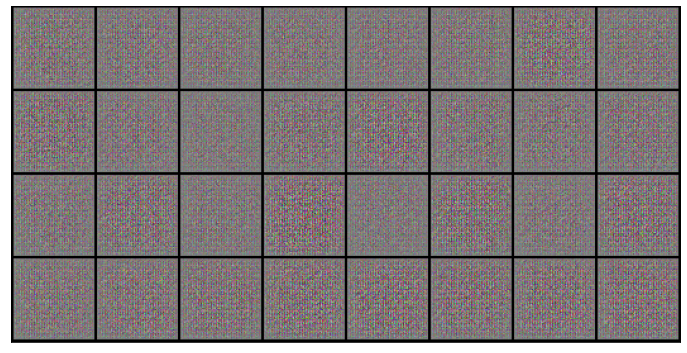

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1).to(device) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images.cpu())

## Train discriminator

In [ ]:
# Establish convention for real and fake labels during training
real_label = 0.9
fake_label = 0.1

In [ ]:
criterion = nn.BCELoss()

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    # real_targets = 0.2*torch.rand((real_images.size(0),), dtype=torch.float, device=device) # On prédit entre 0 et 0.2 pour les vrais
    real_targets = torch.full((real_images.size(0),), real_label, dtype=torch.float, device=device)
    real_loss = criterion(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    # fake_targets = 0.8 + 0.2*torch.rand((fake_images.size(0),), dtype=torch.float, device=device) # On prédit entre 0.8 et 1 pour les faux
    fake_targets = torch.full((fake_images.size(0),), fake_label, dtype=torch.float, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = criterion(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

## Train generator

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    # targets = 0.2*torch.rand((batch_size,), dtype=torch.float, device=device)
    targets = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
    loss = criterion(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

## Results viewer

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


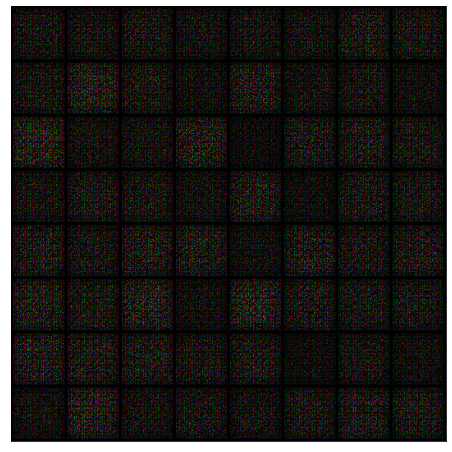

In [ ]:
save_samples(0, fixed_latent)

## Full training loop

In [ ]:
def fit(epochs, lr_d, lr_g, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr_d, betas=(0.5, 0.999), weight_decay=1e-8)
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr_g, betas=(0.5, 0.999), weight_decay=1e-8)
    
    for epoch in range(epochs):
        epoch_average_loss_g, epoch_average_loss_d, real_score_avg, fake_score_avg = 0.0, 0.0, 0.0, 0.0
        for real_images, _ in tqdm(dataloader):
            real_images = real_images.to(device)
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            epoch_average_loss_d += loss_d * batch_size / len(dataset)
            real_score_avg += real_score * batch_size / len(dataset)
            fake_score_avg += fake_score * batch_size / len(dataset)
            # Train generator
            loss_g = train_generator(opt_g)
            epoch_average_loss_g += loss_g * batch_size / len(dataset)
            
        # Record losses & scores
        losses_g.append(epoch_average_loss_g)
        losses_d.append(epoch_average_loss_d)
        real_scores.append(real_score_avg)
        fake_scores.append(fake_score_avg)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, epoch_average_loss_g, epoch_average_loss_d, real_score_avg, fake_score_avg))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
        if epoch % 10 == 0:
            torch.save(generator.state_dict(), 'G-{0:0=4d}.pth'.format(epoch))
            torch.save(discriminator.state_dict(), 'D-{0:0=4d}.pth'.format(epoch))

    
    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr_d = 2e-4
lr_g = 2e-4
epochs = 500

In [ ]:
history = fit(epochs, lr_d, lr_g)


Epoch [1/500], loss_g: 4.5587, loss_d: 1.3791, real_score: 0.7624, fake_score: 0.2684
Saving generated-images-0001.png



Epoch [2/500], loss_g: 2.4889, loss_d: 1.0711, real_score: 0.7413, fake_score: 0.2571
Saving generated-images-0002.png



Epoch [3/500], loss_g: 2.3296, loss_d: 0.9373, real_score: 0.7704, fake_score: 0.2352
Saving generated-images-0003.png



Epoch [4/500], loss_g: 2.2289, loss_d: 1.0507, real_score: 0.7362, fake_score: 0.2666
Saving generated-images-0004.png



Epoch [5/500], loss_g: 1.9931, loss_d: 1.1377, real_score: 0.6979, fake_score: 0.2937
Saving generated-images-0005.png



Epoch [6/500], loss_g: 1.9543, loss_d: 1.0502, real_score: 0.7184, fake_score: 0.2885
Saving generated-images-0006.png



Epoch [7/500], loss_g: 1.9236, loss_d: 1.0971, real_score: 0.7061, fake_score: 0.2970
Saving generated-images-0007.png



Epoch [8/500], loss_g: 1.7381, loss_d: 1.0941, real_score: 0.6900, fake_score: 0.3088
Saving generated-images-0008.png



Epoch [9/500], loss_g: 1.5671, loss_d: 1.1753, real_score: 0.6702, fake_score: 0.3262
Saving generated-images-0009.png



Epoch [10/500], loss_g: 1.6047, loss_d: 1.1628, real_score: 0.6666, fake_score: 0.3333
Saving generated-images-0010.png



Epoch [11/500], loss_g: 1.5672, loss_d: 1.1620, real_score: 0.6627, fake_score: 0.3401
Saving generated-images-0011.png



Epoch [12/500], loss_g: 1.6435, loss_d: 1.1625, real_score: 0.6504, fake_score: 0.3515
Saving generated-images-0012.png



Epoch [13/500], loss_g: 1.5660, loss_d: 1.2123, real_score: 0.6423, fake_score: 0.3549
Saving generated-images-0013.png



Epoch [14/500], loss_g: 1.5735, loss_d: 1.2101, real_score: 0.6466, fake_score: 0.3591
Saving generated-images-0014.png



Epoch [15/500], loss_g: 1.5009, loss_d: 1.2049, real_score: 0.6386, fake_score: 0.3578
Saving generated-images-0015.png



Epoch [16/500], loss_g: 1.4743, loss_d: 1.2421, real_score: 0.6205, fake_score: 0.3773
Saving generated-images-0016.png



Epoch [17/500], loss_g: 1.4305, loss_d: 1.2226, real_score: 0.6226, fake_score: 0.3770
Saving generated-images-0017.png



Epoch [18/500], loss_g: 1.3872, loss_d: 1.2282, real_score: 0.6213, fake_score: 0.3821
Saving generated-images-0018.png



Epoch [19/500], loss_g: 1.3623, loss_d: 1.2608, real_score: 0.6077, fake_score: 0.3850
Saving generated-images-0019.png



Epoch [20/500], loss_g: 1.3785, loss_d: 1.2084, real_score: 0.6279, fake_score: 0.3757
Saving generated-images-0020.png



Epoch [21/500], loss_g: 1.2527, loss_d: 1.2844, real_score: 0.6030, fake_score: 0.3984
Saving generated-images-0021.png



Epoch [22/500], loss_g: 1.3282, loss_d: 1.2357, real_score: 0.6063, fake_score: 0.3913
Saving generated-images-0022.png



Epoch [23/500], loss_g: 1.3436, loss_d: 1.2462, real_score: 0.6102, fake_score: 0.3871
Saving generated-images-0023.png



Epoch [24/500], loss_g: 1.3221, loss_d: 1.2494, real_score: 0.6066, fake_score: 0.3928
Saving generated-images-0024.png



Epoch [25/500], loss_g: 1.2409, loss_d: 1.2574, real_score: 0.6045, fake_score: 0.4008
Saving generated-images-0025.png



Epoch [26/500], loss_g: 1.2540, loss_d: 1.2817, real_score: 0.5965, fake_score: 0.4061
Saving generated-images-0026.png



Epoch [27/500], loss_g: 1.3229, loss_d: 1.2661, real_score: 0.6025, fake_score: 0.3940
Saving generated-images-0027.png



Epoch [28/500], loss_g: 1.2108, loss_d: 1.2396, real_score: 0.6001, fake_score: 0.4009
Saving generated-images-0028.png



Epoch [29/500], loss_g: 1.2209, loss_d: 1.2595, real_score: 0.5946, fake_score: 0.4058
Saving generated-images-0029.png



Epoch [30/500], loss_g: 1.2902, loss_d: 1.2671, real_score: 0.6062, fake_score: 0.3925
Saving generated-images-0030.png



Epoch [31/500], loss_g: 1.2573, loss_d: 1.2502, real_score: 0.6110, fake_score: 0.3922
Saving generated-images-0031.png



Epoch [32/500], loss_g: 1.2261, loss_d: 1.2412, real_score: 0.6065, fake_score: 0.3934
Saving generated-images-0032.png



Epoch [33/500], loss_g: 1.2398, loss_d: 1.2426, real_score: 0.6046, fake_score: 0.3964
Saving generated-images-0033.png



Epoch [34/500], loss_g: 1.2435, loss_d: 1.2368, real_score: 0.6046, fake_score: 0.3935
Saving generated-images-0034.png



Epoch [35/500], loss_g: 1.2806, loss_d: 1.2716, real_score: 0.6058, fake_score: 0.3951
Saving generated-images-0035.png



Epoch [36/500], loss_g: 1.1750, loss_d: 1.2335, real_score: 0.6051, fake_score: 0.3971
Saving generated-images-0036.png



Epoch [37/500], loss_g: 1.2382, loss_d: 1.2565, real_score: 0.6046, fake_score: 0.3940
Saving generated-images-0037.png



Epoch [38/500], loss_g: 1.1602, loss_d: 1.2594, real_score: 0.5979, fake_score: 0.3997
Saving generated-images-0038.png



Epoch [39/500], loss_g: 1.1805, loss_d: 1.2016, real_score: 0.6112, fake_score: 0.3905
Saving generated-images-0039.png



Epoch [40/500], loss_g: 1.2782, loss_d: 1.2510, real_score: 0.6133, fake_score: 0.3864
Saving generated-images-0040.png



Epoch [41/500], loss_g: 1.2023, loss_d: 1.2432, real_score: 0.6076, fake_score: 0.3931
Saving generated-images-0041.png



Epoch [42/500], loss_g: 1.2310, loss_d: 1.2099, real_score: 0.6112, fake_score: 0.3878
Saving generated-images-0042.png



Epoch [43/500], loss_g: 1.2818, loss_d: 1.1938, real_score: 0.6224, fake_score: 0.3777
Saving generated-images-0043.png



Epoch [44/500], loss_g: 1.2099, loss_d: 1.2046, real_score: 0.6236, fake_score: 0.3737
Saving generated-images-0044.png



Epoch [45/500], loss_g: 1.2113, loss_d: 1.2201, real_score: 0.6147, fake_score: 0.3827
Saving generated-images-0045.png



Epoch [46/500], loss_g: 1.3347, loss_d: 1.1988, real_score: 0.6341, fake_score: 0.3682
Saving generated-images-0046.png



Epoch [47/500], loss_g: 1.2368, loss_d: 1.2024, real_score: 0.6417, fake_score: 0.3630
Saving generated-images-0047.png



Epoch [48/500], loss_g: 1.3006, loss_d: 1.2077, real_score: 0.6270, fake_score: 0.3734
Saving generated-images-0048.png



Epoch [49/500], loss_g: 1.2661, loss_d: 1.1566, real_score: 0.6441, fake_score: 0.3534
Saving generated-images-0049.png



Epoch [50/500], loss_g: 1.2734, loss_d: 1.1855, real_score: 0.6397, fake_score: 0.3572
Saving generated-images-0050.png



Epoch [51/500], loss_g: 1.2467, loss_d: 1.1869, real_score: 0.6331, fake_score: 0.3726
Saving generated-images-0051.png



Epoch [52/500], loss_g: 1.1933, loss_d: 1.1938, real_score: 0.6254, fake_score: 0.3730
Saving generated-images-0052.png



Epoch [53/500], loss_g: 1.2589, loss_d: 1.2007, real_score: 0.6231, fake_score: 0.3792
Saving generated-images-0053.png



Epoch [54/500], loss_g: 1.1736, loss_d: 1.2181, real_score: 0.6147, fake_score: 0.3829
Saving generated-images-0054.png



Epoch [55/500], loss_g: 1.2188, loss_d: 1.1932, real_score: 0.6262, fake_score: 0.3758
Saving generated-images-0055.png



Epoch [56/500], loss_g: 1.2298, loss_d: 1.1509, real_score: 0.6399, fake_score: 0.3618
Saving generated-images-0056.png



Epoch [57/500], loss_g: 1.3030, loss_d: 1.1889, real_score: 0.6535, fake_score: 0.3442
Saving generated-images-0057.png



Epoch [58/500], loss_g: 1.2522, loss_d: 1.1831, real_score: 0.6506, fake_score: 0.3505
Saving generated-images-0058.png



Epoch [59/500], loss_g: 1.2153, loss_d: 1.1762, real_score: 0.6270, fake_score: 0.3699
Saving generated-images-0059.png



Epoch [60/500], loss_g: 1.2120, loss_d: 1.2015, real_score: 0.6240, fake_score: 0.3769
Saving generated-images-0060.png



Epoch [61/500], loss_g: 1.2252, loss_d: 1.1853, real_score: 0.6298, fake_score: 0.3748
Saving generated-images-0061.png



Epoch [62/500], loss_g: 1.2454, loss_d: 1.1756, real_score: 0.6311, fake_score: 0.3692
Saving generated-images-0062.png



Epoch [63/500], loss_g: 1.2180, loss_d: 1.1831, real_score: 0.6369, fake_score: 0.3612
Saving generated-images-0063.png



Epoch [64/500], loss_g: 1.2480, loss_d: 1.1773, real_score: 0.6318, fake_score: 0.3711
Saving generated-images-0064.png



Epoch [65/500], loss_g: 1.2733, loss_d: 1.1686, real_score: 0.6436, fake_score: 0.3552
Saving generated-images-0065.png



Epoch [66/500], loss_g: 1.2795, loss_d: 1.1838, real_score: 0.6377, fake_score: 0.3658
Saving generated-images-0066.png



Epoch [67/500], loss_g: 1.2707, loss_d: 1.1677, real_score: 0.6480, fake_score: 0.3502
Saving generated-images-0067.png



Epoch [68/500], loss_g: 1.2360, loss_d: 1.1716, real_score: 0.6454, fake_score: 0.3539
Saving generated-images-0068.png



Epoch [69/500], loss_g: 1.3241, loss_d: 1.1432, real_score: 0.6674, fake_score: 0.3334
Saving generated-images-0069.png



Epoch [70/500], loss_g: 1.2608, loss_d: 1.1590, real_score: 0.6649, fake_score: 0.3334
Saving generated-images-0070.png



Epoch [71/500], loss_g: 1.1969, loss_d: 1.1798, real_score: 0.6587, fake_score: 0.3481
Saving generated-images-0071.png



Epoch [72/500], loss_g: 1.2906, loss_d: 1.1301, real_score: 0.6619, fake_score: 0.3393
Saving generated-images-0072.png



Epoch [73/500], loss_g: 1.2517, loss_d: 1.1726, real_score: 0.6445, fake_score: 0.3505
Saving generated-images-0073.png



Epoch [74/500], loss_g: 1.2711, loss_d: 1.1333, real_score: 0.6624, fake_score: 0.3427
Saving generated-images-0074.png



Epoch [75/500], loss_g: 1.2441, loss_d: 1.1468, real_score: 0.6613, fake_score: 0.3419
Saving generated-images-0075.png



Epoch [76/500], loss_g: 1.2279, loss_d: 1.1583, real_score: 0.6417, fake_score: 0.3504
Saving generated-images-0076.png



Epoch [77/500], loss_g: 1.2719, loss_d: 1.1437, real_score: 0.6520, fake_score: 0.3499
Saving generated-images-0077.png



Epoch [78/500], loss_g: 1.2369, loss_d: 1.1085, real_score: 0.6611, fake_score: 0.3401
Saving generated-images-0078.png



Epoch [79/500], loss_g: 1.2955, loss_d: 1.1057, real_score: 0.6714, fake_score: 0.3269
Saving generated-images-0079.png



Epoch [80/500], loss_g: 1.3555, loss_d: 1.1694, real_score: 0.6660, fake_score: 0.3384
Saving generated-images-0080.png



Epoch [81/500], loss_g: 1.2950, loss_d: 1.1069, real_score: 0.6737, fake_score: 0.3288
Saving generated-images-0081.png



Epoch [82/500], loss_g: 1.2088, loss_d: 1.1549, real_score: 0.6462, fake_score: 0.3519
Saving generated-images-0082.png



Epoch [83/500], loss_g: 1.2852, loss_d: 1.1113, real_score: 0.6758, fake_score: 0.3208
Saving generated-images-0083.png



Epoch [84/500], loss_g: 1.2448, loss_d: 1.1401, real_score: 0.6711, fake_score: 0.3384
Saving generated-images-0084.png



Epoch [85/500], loss_g: 1.3117, loss_d: 1.1061, real_score: 0.6753, fake_score: 0.3182
Saving generated-images-0085.png



Epoch [86/500], loss_g: 1.2520, loss_d: 1.1290, real_score: 0.6602, fake_score: 0.3396
Saving generated-images-0086.png



Epoch [87/500], loss_g: 1.2659, loss_d: 1.1383, real_score: 0.6653, fake_score: 0.3415
Saving generated-images-0087.png



Epoch [88/500], loss_g: 1.2094, loss_d: 1.1455, real_score: 0.6518, fake_score: 0.3487
Saving generated-images-0088.png



Epoch [89/500], loss_g: 1.2774, loss_d: 1.1338, real_score: 0.6699, fake_score: 0.3318
Saving generated-images-0089.png



Epoch [90/500], loss_g: 1.2704, loss_d: 1.1522, real_score: 0.6523, fake_score: 0.3444
Saving generated-images-0090.png



Epoch [91/500], loss_g: 1.2614, loss_d: 1.1270, real_score: 0.6680, fake_score: 0.3343
Saving generated-images-0091.png



Epoch [92/500], loss_g: 1.2970, loss_d: 1.1012, real_score: 0.6737, fake_score: 0.3259
Saving generated-images-0092.png



Epoch [93/500], loss_g: 1.2467, loss_d: 1.1310, real_score: 0.6598, fake_score: 0.3397
Saving generated-images-0093.png



Epoch [94/500], loss_g: 1.2197, loss_d: 1.1301, real_score: 0.6545, fake_score: 0.3440
Saving generated-images-0094.png



Epoch [95/500], loss_g: 1.2841, loss_d: 1.1323, real_score: 0.6611, fake_score: 0.3446
Saving generated-images-0095.png



Epoch [96/500], loss_g: 1.2460, loss_d: 1.1374, real_score: 0.6573, fake_score: 0.3414
Saving generated-images-0096.png



Epoch [97/500], loss_g: 1.2717, loss_d: 1.1711, real_score: 0.6300, fake_score: 0.3702
Saving generated-images-0097.png



Epoch [98/500], loss_g: 1.2078, loss_d: 1.1190, real_score: 0.6512, fake_score: 0.3472
Saving generated-images-0098.png



Epoch [99/500], loss_g: 1.2589, loss_d: 1.1269, real_score: 0.6541, fake_score: 0.3474
Saving generated-images-0099.png



Epoch [100/500], loss_g: 1.3183, loss_d: 1.1247, real_score: 0.6662, fake_score: 0.3371
Saving generated-images-0100.png



Epoch [101/500], loss_g: 1.3010, loss_d: 1.1159, real_score: 0.6680, fake_score: 0.3244
Saving generated-images-0101.png



Epoch [102/500], loss_g: 1.3151, loss_d: 1.1200, real_score: 0.6704, fake_score: 0.3298
Saving generated-images-0102.png



Epoch [103/500], loss_g: 1.3461, loss_d: 1.0791, real_score: 0.6850, fake_score: 0.3174
Saving generated-images-0103.png



Epoch [104/500], loss_g: 1.3348, loss_d: 1.0902, real_score: 0.6873, fake_score: 0.3131
Saving generated-images-0104.png



Epoch [105/500], loss_g: 1.3409, loss_d: 1.0678, real_score: 0.7010, fake_score: 0.3040
Saving generated-images-0105.png



Epoch [106/500], loss_g: 1.3462, loss_d: 1.0899, real_score: 0.6853, fake_score: 0.3084
Saving generated-images-0106.png



Epoch [107/500], loss_g: 1.2503, loss_d: 1.0630, real_score: 0.6815, fake_score: 0.3258
Saving generated-images-0107.png



Epoch [108/500], loss_g: 1.3183, loss_d: 1.1099, real_score: 0.6756, fake_score: 0.3268
Saving generated-images-0108.png



Epoch [109/500], loss_g: 1.3085, loss_d: 1.1002, real_score: 0.6715, fake_score: 0.3203
Saving generated-images-0109.png



Epoch [110/500], loss_g: 1.2686, loss_d: 1.0884, real_score: 0.6791, fake_score: 0.3229
Saving generated-images-0110.png



Epoch [111/500], loss_g: 1.3088, loss_d: 1.1148, real_score: 0.6783, fake_score: 0.3250
Saving generated-images-0111.png



Epoch [112/500], loss_g: 1.2714, loss_d: 1.1019, real_score: 0.6712, fake_score: 0.3284
Saving generated-images-0112.png



Epoch [113/500], loss_g: 1.3264, loss_d: 1.0873, real_score: 0.6791, fake_score: 0.3185
Saving generated-images-0113.png



Epoch [114/500], loss_g: 1.2575, loss_d: 1.0750, real_score: 0.6878, fake_score: 0.3136
Saving generated-images-0114.png



Epoch [115/500], loss_g: 1.2991, loss_d: 1.0869, real_score: 0.6861, fake_score: 0.3165
Saving generated-images-0115.png



Epoch [116/500], loss_g: 1.2663, loss_d: 1.1018, real_score: 0.6764, fake_score: 0.3223
Saving generated-images-0116.png



Epoch [117/500], loss_g: 1.2870, loss_d: 1.0862, real_score: 0.6847, fake_score: 0.3129
Saving generated-images-0117.png



Epoch [118/500], loss_g: 1.3293, loss_d: 1.0776, real_score: 0.6970, fake_score: 0.3124
Saving generated-images-0118.png



Epoch [119/500], loss_g: 1.3149, loss_d: 1.0838, real_score: 0.6864, fake_score: 0.3080
Saving generated-images-0119.png



Epoch [120/500], loss_g: 1.3021, loss_d: 1.0812, real_score: 0.6883, fake_score: 0.3125
Saving generated-images-0120.png



Epoch [121/500], loss_g: 1.3051, loss_d: 1.0766, real_score: 0.6939, fake_score: 0.3061
Saving generated-images-0121.png



Epoch [122/500], loss_g: 1.3409, loss_d: 1.0646, real_score: 0.6994, fake_score: 0.2987
Saving generated-images-0122.png



Epoch [123/500], loss_g: 1.2883, loss_d: 1.0915, real_score: 0.6865, fake_score: 0.3223
Saving generated-images-0123.png



Epoch [124/500], loss_g: 1.3432, loss_d: 1.0744, real_score: 0.6939, fake_score: 0.3010
Saving generated-images-0124.png



Epoch [125/500], loss_g: 1.3291, loss_d: 1.0553, real_score: 0.6940, fake_score: 0.3053
Saving generated-images-0125.png



Epoch [126/500], loss_g: 1.3209, loss_d: 1.0739, real_score: 0.6931, fake_score: 0.3129
Saving generated-images-0126.png



Epoch [127/500], loss_g: 1.2845, loss_d: 1.0634, real_score: 0.6936, fake_score: 0.3070
Saving generated-images-0127.png



Epoch [128/500], loss_g: 1.3473, loss_d: 1.0616, real_score: 0.6802, fake_score: 0.3224
Saving generated-images-0128.png



Epoch [129/500], loss_g: 1.2972, loss_d: 1.0807, real_score: 0.6803, fake_score: 0.3128
Saving generated-images-0129.png



Epoch [130/500], loss_g: 1.3105, loss_d: 1.1360, real_score: 0.6663, fake_score: 0.3361
Saving generated-images-0130.png



Epoch [131/500], loss_g: 1.2589, loss_d: 1.0865, real_score: 0.6675, fake_score: 0.3312
Saving generated-images-0131.png



Epoch [132/500], loss_g: 1.2304, loss_d: 1.0726, real_score: 0.6750, fake_score: 0.3276
Saving generated-images-0132.png



Epoch [133/500], loss_g: 1.2996, loss_d: 1.0770, real_score: 0.6716, fake_score: 0.3299
Saving generated-images-0133.png



Epoch [134/500], loss_g: 1.3218, loss_d: 1.0687, real_score: 0.6714, fake_score: 0.3268
Saving generated-images-0134.png



Epoch [135/500], loss_g: 1.3083, loss_d: 1.0842, real_score: 0.6814, fake_score: 0.3178
Saving generated-images-0135.png



Epoch [136/500], loss_g: 1.3263, loss_d: 1.0681, real_score: 0.6909, fake_score: 0.3160
Saving generated-images-0136.png



Epoch [137/500], loss_g: 1.3040, loss_d: 1.0707, real_score: 0.6799, fake_score: 0.3179
Saving generated-images-0137.png



Epoch [138/500], loss_g: 1.3327, loss_d: 1.0719, real_score: 0.6951, fake_score: 0.3028
Saving generated-images-0138.png



Epoch [139/500], loss_g: 1.3705, loss_d: 1.0453, real_score: 0.6994, fake_score: 0.3062
Saving generated-images-0139.png



Epoch [140/500], loss_g: 1.3315, loss_d: 1.0392, real_score: 0.6974, fake_score: 0.2996
Saving generated-images-0140.png



Epoch [141/500], loss_g: 1.3776, loss_d: 1.0468, real_score: 0.7018, fake_score: 0.2968
Saving generated-images-0141.png



Epoch [142/500], loss_g: 1.4142, loss_d: 1.0462, real_score: 0.6973, fake_score: 0.3040
Saving generated-images-0142.png



Epoch [143/500], loss_g: 1.3551, loss_d: 1.0541, real_score: 0.6890, fake_score: 0.3067
Saving generated-images-0143.png



Epoch [144/500], loss_g: 1.3740, loss_d: 1.0419, real_score: 0.7031, fake_score: 0.2993
Saving generated-images-0144.png



Epoch [145/500], loss_g: 1.3630, loss_d: 1.0345, real_score: 0.7019, fake_score: 0.3025
Saving generated-images-0145.png



Epoch [146/500], loss_g: 1.3860, loss_d: 1.0169, real_score: 0.7020, fake_score: 0.2948
Saving generated-images-0146.png



Epoch [147/500], loss_g: 1.3889, loss_d: 1.0188, real_score: 0.7084, fake_score: 0.2918
Saving generated-images-0147.png



Epoch [148/500], loss_g: 1.3818, loss_d: 1.0170, real_score: 0.7103, fake_score: 0.2936
Saving generated-images-0148.png



Epoch [149/500], loss_g: 1.3682, loss_d: 1.0113, real_score: 0.7057, fake_score: 0.2946
Saving generated-images-0149.png



Epoch [150/500], loss_g: 1.4032, loss_d: 1.0201, real_score: 0.7022, fake_score: 0.2951
Saving generated-images-0150.png



Epoch [151/500], loss_g: 1.3695, loss_d: 1.0513, real_score: 0.6923, fake_score: 0.3121
Saving generated-images-0151.png



Epoch [152/500], loss_g: 1.3871, loss_d: 1.0367, real_score: 0.6999, fake_score: 0.3020
Saving generated-images-0152.png



Epoch [153/500], loss_g: 1.4396, loss_d: 1.0438, real_score: 0.7010, fake_score: 0.2942
Saving generated-images-0153.png



Epoch [154/500], loss_g: 1.3943, loss_d: 1.0228, real_score: 0.7152, fake_score: 0.2911
Saving generated-images-0154.png



Epoch [155/500], loss_g: 1.3910, loss_d: 1.0246, real_score: 0.7085, fake_score: 0.2922
Saving generated-images-0155.png



Epoch [156/500], loss_g: 1.3834, loss_d: 1.0187, real_score: 0.7101, fake_score: 0.2903
Saving generated-images-0156.png



Epoch [157/500], loss_g: 1.4441, loss_d: 1.0012, real_score: 0.7208, fake_score: 0.2757
Saving generated-images-0157.png



Epoch [158/500], loss_g: 1.4201, loss_d: 1.0164, real_score: 0.7051, fake_score: 0.2934
Saving generated-images-0158.png



Epoch [159/500], loss_g: 1.3802, loss_d: 1.0049, real_score: 0.7160, fake_score: 0.2855
Saving generated-images-0159.png



Epoch [160/500], loss_g: 1.4440, loss_d: 0.9795, real_score: 0.7233, fake_score: 0.2737
Saving generated-images-0160.png



Epoch [161/500], loss_g: 1.4206, loss_d: 0.9842, real_score: 0.7279, fake_score: 0.2728
Saving generated-images-0161.png



Epoch [162/500], loss_g: 1.4182, loss_d: 1.0062, real_score: 0.7157, fake_score: 0.2836
Saving generated-images-0162.png



Epoch [163/500], loss_g: 1.4568, loss_d: 1.0168, real_score: 0.7209, fake_score: 0.2829
Saving generated-images-0163.png



Epoch [164/500], loss_g: 1.5156, loss_d: 0.9534, real_score: 0.7408, fake_score: 0.2629
Saving generated-images-0164.png



Epoch [165/500], loss_g: 1.4722, loss_d: 0.9834, real_score: 0.7252, fake_score: 0.2679
Saving generated-images-0165.png



Epoch [166/500], loss_g: 1.4514, loss_d: 0.9812, real_score: 0.7273, fake_score: 0.2761
Saving generated-images-0166.png



Epoch [167/500], loss_g: 1.5123, loss_d: 0.9906, real_score: 0.7285, fake_score: 0.2715
Saving generated-images-0167.png



Epoch [168/500], loss_g: 1.4842, loss_d: 0.9656, real_score: 0.7331, fake_score: 0.2707
Saving generated-images-0168.png



Epoch [169/500], loss_g: 1.4599, loss_d: 0.9755, real_score: 0.7245, fake_score: 0.2700
Saving generated-images-0169.png



Epoch [170/500], loss_g: 1.4588, loss_d: 0.9874, real_score: 0.7284, fake_score: 0.2801
Saving generated-images-0170.png



Epoch [171/500], loss_g: 1.4896, loss_d: 1.0003, real_score: 0.7250, fake_score: 0.2741
Saving generated-images-0171.png



Epoch [172/500], loss_g: 1.4371, loss_d: 0.9757, real_score: 0.7251, fake_score: 0.2690
Saving generated-images-0172.png



Epoch [173/500], loss_g: 1.5143, loss_d: 0.9832, real_score: 0.7371, fake_score: 0.2708
Saving generated-images-0173.png



Epoch [174/500], loss_g: 1.4958, loss_d: 0.9927, real_score: 0.7291, fake_score: 0.2680
Saving generated-images-0174.png



Epoch [175/500], loss_g: 1.4866, loss_d: 0.9599, real_score: 0.7334, fake_score: 0.2678
Saving generated-images-0175.png



Epoch [176/500], loss_g: 1.5081, loss_d: 0.9486, real_score: 0.7448, fake_score: 0.2503
Saving generated-images-0176.png



Epoch [177/500], loss_g: 1.4763, loss_d: 0.9669, real_score: 0.7429, fake_score: 0.2650
Saving generated-images-0177.png



Epoch [178/500], loss_g: 1.5237, loss_d: 0.9562, real_score: 0.7425, fake_score: 0.2589
Saving generated-images-0178.png



Epoch [179/500], loss_g: 1.5212, loss_d: 0.9697, real_score: 0.7305, fake_score: 0.2643
Saving generated-images-0179.png



Epoch [180/500], loss_g: 1.5310, loss_d: 0.9295, real_score: 0.7551, fake_score: 0.2488
Saving generated-images-0180.png



Epoch [181/500], loss_g: 1.5397, loss_d: 0.9433, real_score: 0.7448, fake_score: 0.2549
Saving generated-images-0181.png



Epoch [182/500], loss_g: 1.4966, loss_d: 0.9741, real_score: 0.7344, fake_score: 0.2660
Saving generated-images-0182.png



Epoch [183/500], loss_g: 1.5556, loss_d: 0.9485, real_score: 0.7406, fake_score: 0.2561
Saving generated-images-0183.png



Epoch [184/500], loss_g: 1.5745, loss_d: 0.9481, real_score: 0.7526, fake_score: 0.2498
Saving generated-images-0184.png



Epoch [185/500], loss_g: 1.5961, loss_d: 0.9304, real_score: 0.7551, fake_score: 0.2459
Saving generated-images-0185.png



Epoch [186/500], loss_g: 1.5702, loss_d: 0.9522, real_score: 0.7460, fake_score: 0.2544
Saving generated-images-0186.png



Epoch [187/500], loss_g: 1.5089, loss_d: 0.9635, real_score: 0.7357, fake_score: 0.2624
Saving generated-images-0187.png



Epoch [188/500], loss_g: 1.5117, loss_d: 0.9570, real_score: 0.7385, fake_score: 0.2650
Saving generated-images-0188.png



Epoch [189/500], loss_g: 1.5808, loss_d: 0.9166, real_score: 0.7579, fake_score: 0.2423
Saving generated-images-0189.png



Epoch [190/500], loss_g: 1.6042, loss_d: 0.9441, real_score: 0.7515, fake_score: 0.2504
Saving generated-images-0190.png



Epoch [191/500], loss_g: 1.5688, loss_d: 0.9387, real_score: 0.7543, fake_score: 0.2438
Saving generated-images-0191.png



Epoch [192/500], loss_g: 1.5266, loss_d: 0.9490, real_score: 0.7441, fake_score: 0.2566
Saving generated-images-0192.png



Epoch [193/500], loss_g: 1.5997, loss_d: 0.9168, real_score: 0.7642, fake_score: 0.2347
Saving generated-images-0193.png



Epoch [194/500], loss_g: 1.5443, loss_d: 0.9255, real_score: 0.7593, fake_score: 0.2454
Saving generated-images-0194.png



Epoch [195/500], loss_g: 1.5816, loss_d: 0.9086, real_score: 0.7623, fake_score: 0.2351
Saving generated-images-0195.png



Epoch [196/500], loss_g: 1.5794, loss_d: 0.9303, real_score: 0.7607, fake_score: 0.2429
Saving generated-images-0196.png



Epoch [197/500], loss_g: 1.6232, loss_d: 0.9063, real_score: 0.7674, fake_score: 0.2309
Saving generated-images-0197.png



Epoch [198/500], loss_g: 1.5452, loss_d: 0.9148, real_score: 0.7556, fake_score: 0.2439
Saving generated-images-0198.png



Epoch [199/500], loss_g: 1.5847, loss_d: 0.9240, real_score: 0.7530, fake_score: 0.2460
Saving generated-images-0199.png



Epoch [200/500], loss_g: 1.5801, loss_d: 0.9166, real_score: 0.7595, fake_score: 0.2433
Saving generated-images-0200.png



Epoch [201/500], loss_g: 1.5748, loss_d: 0.9556, real_score: 0.7514, fake_score: 0.2538
Saving generated-images-0201.png



Epoch [202/500], loss_g: 1.6770, loss_d: 0.9372, real_score: 0.7585, fake_score: 0.2363
Saving generated-images-0202.png



Epoch [203/500], loss_g: 1.5468, loss_d: 0.9209, real_score: 0.7581, fake_score: 0.2429
Saving generated-images-0203.png



Epoch [204/500], loss_g: 1.5493, loss_d: 0.9095, real_score: 0.7564, fake_score: 0.2469
Saving generated-images-0204.png



Epoch [205/500], loss_g: 1.6580, loss_d: 0.9212, real_score: 0.7598, fake_score: 0.2400
Saving generated-images-0205.png



Epoch [206/500], loss_g: 1.5614, loss_d: 0.9314, real_score: 0.7493, fake_score: 0.2510
Saving generated-images-0206.png



Epoch [207/500], loss_g: 1.6299, loss_d: 0.8946, real_score: 0.7665, fake_score: 0.2358
Saving generated-images-0207.png



Epoch [208/500], loss_g: 1.5999, loss_d: 0.8966, real_score: 0.7646, fake_score: 0.2306
Saving generated-images-0208.png



Epoch [209/500], loss_g: 1.6567, loss_d: 0.9271, real_score: 0.7499, fake_score: 0.2543
Saving generated-images-0209.png



Epoch [210/500], loss_g: 1.5931, loss_d: 0.8989, real_score: 0.7633, fake_score: 0.2349
Saving generated-images-0210.png



Epoch [211/500], loss_g: 1.6129, loss_d: 0.9256, real_score: 0.7606, fake_score: 0.2417
Saving generated-images-0211.png



Epoch [212/500], loss_g: 1.6052, loss_d: 0.9102, real_score: 0.7669, fake_score: 0.2316
Saving generated-images-0212.png



Epoch [213/500], loss_g: 1.6693, loss_d: 0.9079, real_score: 0.7639, fake_score: 0.2363
Saving generated-images-0213.png



Epoch [214/500], loss_g: 1.6088, loss_d: 0.9142, real_score: 0.7598, fake_score: 0.2377
Saving generated-images-0214.png



Epoch [215/500], loss_g: 1.6231, loss_d: 0.9138, real_score: 0.7651, fake_score: 0.2345
Saving generated-images-0215.png



Epoch [216/500], loss_g: 1.6186, loss_d: 0.8892, real_score: 0.7725, fake_score: 0.2279
Saving generated-images-0216.png



Epoch [217/500], loss_g: 1.6751, loss_d: 0.9041, real_score: 0.7694, fake_score: 0.2370
Saving generated-images-0217.png



Epoch [218/500], loss_g: 1.5602, loss_d: 0.9251, real_score: 0.7584, fake_score: 0.2402
Saving generated-images-0218.png



Epoch [219/500], loss_g: 1.6795, loss_d: 0.8931, real_score: 0.7721, fake_score: 0.2310
Saving generated-images-0219.png



Epoch [220/500], loss_g: 1.6689, loss_d: 0.8695, real_score: 0.7788, fake_score: 0.2218
Saving generated-images-0220.png



Epoch [221/500], loss_g: 1.6473, loss_d: 0.8690, real_score: 0.7725, fake_score: 0.2257
Saving generated-images-0221.png



Epoch [222/500], loss_g: 1.6872, loss_d: 0.8866, real_score: 0.7751, fake_score: 0.2248
Saving generated-images-0222.png



Epoch [223/500], loss_g: 1.6788, loss_d: 0.9102, real_score: 0.7699, fake_score: 0.2313
Saving generated-images-0223.png



Epoch [224/500], loss_g: 1.7133, loss_d: 0.9034, real_score: 0.7750, fake_score: 0.2264
Saving generated-images-0224.png



Epoch [225/500], loss_g: 1.6636, loss_d: 0.8926, real_score: 0.7759, fake_score: 0.2219
Saving generated-images-0225.png



Epoch [226/500], loss_g: 1.6370, loss_d: 0.8686, real_score: 0.7771, fake_score: 0.2231
Saving generated-images-0226.png



Epoch [227/500], loss_g: 1.6731, loss_d: 0.8709, real_score: 0.7827, fake_score: 0.2219
Saving generated-images-0227.png



Epoch [228/500], loss_g: 1.7217, loss_d: 0.8847, real_score: 0.7780, fake_score: 0.2194
Saving generated-images-0228.png



Epoch [229/500], loss_g: 1.6746, loss_d: 0.8651, real_score: 0.7839, fake_score: 0.2204
Saving generated-images-0229.png



Epoch [230/500], loss_g: 1.6896, loss_d: 0.9015, real_score: 0.7723, fake_score: 0.2234
Saving generated-images-0230.png



Epoch [231/500], loss_g: 1.6475, loss_d: 0.9011, real_score: 0.7710, fake_score: 0.2331
Saving generated-images-0231.png



Epoch [232/500], loss_g: 1.7541, loss_d: 0.8790, real_score: 0.7812, fake_score: 0.2202
Saving generated-images-0232.png



Epoch [233/500], loss_g: 1.6537, loss_d: 0.8856, real_score: 0.7738, fake_score: 0.2253
Saving generated-images-0233.png



Epoch [234/500], loss_g: 1.6873, loss_d: 0.8900, real_score: 0.7747, fake_score: 0.2265
Saving generated-images-0234.png



Epoch [235/500], loss_g: 1.7381, loss_d: 0.8547, real_score: 0.7857, fake_score: 0.2110
Saving generated-images-0235.png



Epoch [236/500], loss_g: 1.6535, loss_d: 0.8956, real_score: 0.7729, fake_score: 0.2297
Saving generated-images-0236.png



Epoch [237/500], loss_g: 1.7471, loss_d: 0.8688, real_score: 0.7886, fake_score: 0.2145
Saving generated-images-0237.png



Epoch [238/500], loss_g: 1.7041, loss_d: 0.8639, real_score: 0.7859, fake_score: 0.2139
Saving generated-images-0238.png



Epoch [239/500], loss_g: 1.7258, loss_d: 0.8592, real_score: 0.7921, fake_score: 0.2077
Saving generated-images-0239.png



Epoch [240/500], loss_g: 1.7742, loss_d: 0.8409, real_score: 0.7948, fake_score: 0.2058
Saving generated-images-0240.png



Epoch [241/500], loss_g: 1.7269, loss_d: 0.8980, real_score: 0.7770, fake_score: 0.2203
Saving generated-images-0241.png



Epoch [242/500], loss_g: 1.7022, loss_d: 0.8613, real_score: 0.7866, fake_score: 0.2174
Saving generated-images-0242.png



Epoch [243/500], loss_g: 1.7724, loss_d: 0.8452, real_score: 0.7920, fake_score: 0.2053
Saving generated-images-0243.png



Epoch [244/500], loss_g: 1.6527, loss_d: 0.8556, real_score: 0.7873, fake_score: 0.2132
Saving generated-images-0244.png



Epoch [245/500], loss_g: 1.7497, loss_d: 0.8610, real_score: 0.7890, fake_score: 0.2139
Saving generated-images-0245.png



Epoch [246/500], loss_g: 1.7539, loss_d: 0.8629, real_score: 0.7890, fake_score: 0.2072
Saving generated-images-0246.png



Epoch [247/500], loss_g: 1.7184, loss_d: 0.8587, real_score: 0.7892, fake_score: 0.2125
Saving generated-images-0247.png



Epoch [248/500], loss_g: 1.7737, loss_d: 0.8485, real_score: 0.7958, fake_score: 0.2075
Saving generated-images-0248.png



Epoch [249/500], loss_g: 1.7858, loss_d: 0.8731, real_score: 0.7862, fake_score: 0.2113
Saving generated-images-0249.png



Epoch [250/500], loss_g: 1.7407, loss_d: 0.8578, real_score: 0.7952, fake_score: 0.2091
Saving generated-images-0250.png



Epoch [251/500], loss_g: 1.7357, loss_d: 0.8631, real_score: 0.7873, fake_score: 0.2124
Saving generated-images-0251.png



Epoch [252/500], loss_g: 1.7592, loss_d: 0.8560, real_score: 0.7908, fake_score: 0.2095
Saving generated-images-0252.png



Epoch [253/500], loss_g: 1.8526, loss_d: 0.8624, real_score: 0.7985, fake_score: 0.2032
Saving generated-images-0253.png



Epoch [254/500], loss_g: 1.7816, loss_d: 0.8583, real_score: 0.7852, fake_score: 0.2118
Saving generated-images-0254.png



Epoch [255/500], loss_g: 1.7199, loss_d: 0.8430, real_score: 0.7926, fake_score: 0.2066
Saving generated-images-0255.png



Epoch [256/500], loss_g: 1.8131, loss_d: 0.8266, real_score: 0.8047, fake_score: 0.1975
Saving generated-images-0256.png



Epoch [257/500], loss_g: 1.7236, loss_d: 0.8624, real_score: 0.7891, fake_score: 0.2112
Saving generated-images-0257.png



Epoch [258/500], loss_g: 1.8605, loss_d: 0.8190, real_score: 0.8098, fake_score: 0.1924
Saving generated-images-0258.png



Epoch [259/500], loss_g: 1.7927, loss_d: 0.8405, real_score: 0.8020, fake_score: 0.1981
Saving generated-images-0259.png



Epoch [260/500], loss_g: 1.7508, loss_d: 0.8471, real_score: 0.7905, fake_score: 0.2050
Saving generated-images-0260.png



Epoch [261/500], loss_g: 1.7366, loss_d: 0.8591, real_score: 0.7933, fake_score: 0.2108
Saving generated-images-0261.png



Epoch [262/500], loss_g: 1.7442, loss_d: 0.8412, real_score: 0.7973, fake_score: 0.2036
Saving generated-images-0262.png



Epoch [263/500], loss_g: 1.8363, loss_d: 0.8158, real_score: 0.8129, fake_score: 0.1875
Saving generated-images-0263.png



Epoch [264/500], loss_g: 1.7971, loss_d: 0.8218, real_score: 0.8066, fake_score: 0.1925
Saving generated-images-0264.png



Epoch [265/500], loss_g: 1.7167, loss_d: 0.8295, real_score: 0.7971, fake_score: 0.2027
Saving generated-images-0265.png



Epoch [266/500], loss_g: 1.8619, loss_d: 0.8436, real_score: 0.8069, fake_score: 0.1969
Saving generated-images-0266.png



Epoch [267/500], loss_g: 1.7943, loss_d: 0.8356, real_score: 0.8010, fake_score: 0.2000
Saving generated-images-0267.png



Epoch [268/500], loss_g: 1.8379, loss_d: 0.8303, real_score: 0.8068, fake_score: 0.1941
Saving generated-images-0268.png



Epoch [269/500], loss_g: 1.7935, loss_d: 0.8072, real_score: 0.8089, fake_score: 0.1902
Saving generated-images-0269.png



Epoch [270/500], loss_g: 1.8210, loss_d: 0.8338, real_score: 0.7999, fake_score: 0.1984
Saving generated-images-0270.png



Epoch [271/500], loss_g: 1.8197, loss_d: 0.8229, real_score: 0.8097, fake_score: 0.1919
Saving generated-images-0271.png



Epoch [272/500], loss_g: 1.8217, loss_d: 0.8458, real_score: 0.8006, fake_score: 0.2015
Saving generated-images-0272.png



Epoch [273/500], loss_g: 1.8472, loss_d: 0.8507, real_score: 0.8030, fake_score: 0.1994
Saving generated-images-0273.png



Epoch [274/500], loss_g: 1.8678, loss_d: 0.8451, real_score: 0.8020, fake_score: 0.1989
Saving generated-images-0274.png



Epoch [275/500], loss_g: 1.8457, loss_d: 0.8293, real_score: 0.8055, fake_score: 0.1935
Saving generated-images-0275.png



Epoch [276/500], loss_g: 1.7806, loss_d: 0.8346, real_score: 0.8019, fake_score: 0.1960
Saving generated-images-0276.png



Epoch [277/500], loss_g: 1.8898, loss_d: 0.8205, real_score: 0.8094, fake_score: 0.1926
Saving generated-images-0277.png



Epoch [278/500], loss_g: 1.8286, loss_d: 0.8243, real_score: 0.8079, fake_score: 0.1933
Saving generated-images-0278.png



Epoch [279/500], loss_g: 1.8337, loss_d: 0.8521, real_score: 0.7979, fake_score: 0.2012
Saving generated-images-0279.png



Epoch [280/500], loss_g: 1.7446, loss_d: 0.8297, real_score: 0.8048, fake_score: 0.1967
Saving generated-images-0280.png



Epoch [281/500], loss_g: 1.8337, loss_d: 0.8450, real_score: 0.8039, fake_score: 0.1985
Saving generated-images-0281.png



Epoch [282/500], loss_g: 1.8131, loss_d: 0.8260, real_score: 0.8065, fake_score: 0.1920
Saving generated-images-0282.png



Epoch [283/500], loss_g: 1.7987, loss_d: 0.8259, real_score: 0.8103, fake_score: 0.1913
Saving generated-images-0283.png



Epoch [284/500], loss_g: 1.8125, loss_d: 0.8487, real_score: 0.8016, fake_score: 0.2010
Saving generated-images-0284.png



Epoch [285/500], loss_g: 1.8919, loss_d: 0.8236, real_score: 0.8098, fake_score: 0.1875
Saving generated-images-0285.png



Epoch [286/500], loss_g: 1.8497, loss_d: 0.8020, real_score: 0.8177, fake_score: 0.1840
Saving generated-images-0286.png



Epoch [287/500], loss_g: 1.8903, loss_d: 0.8309, real_score: 0.8155, fake_score: 0.1860
Saving generated-images-0287.png



Epoch [288/500], loss_g: 1.8754, loss_d: 0.8366, real_score: 0.8060, fake_score: 0.1935
Saving generated-images-0288.png



Epoch [289/500], loss_g: 1.8234, loss_d: 0.8181, real_score: 0.8154, fake_score: 0.1867
Saving generated-images-0289.png



Epoch [290/500], loss_g: 1.8447, loss_d: 0.8037, real_score: 0.8109, fake_score: 0.1887
Saving generated-images-0290.png



Epoch [291/500], loss_g: 1.8864, loss_d: 0.8041, real_score: 0.8187, fake_score: 0.1786
Saving generated-images-0291.png



Epoch [292/500], loss_g: 1.8776, loss_d: 0.8338, real_score: 0.8135, fake_score: 0.1904
Saving generated-images-0292.png



Epoch [293/500], loss_g: 1.8243, loss_d: 0.8101, real_score: 0.8158, fake_score: 0.1854
Saving generated-images-0293.png



Epoch [294/500], loss_g: 1.9114, loss_d: 0.7845, real_score: 0.8246, fake_score: 0.1742
Saving generated-images-0294.png



Epoch [295/500], loss_g: 1.8830, loss_d: 0.8101, real_score: 0.8202, fake_score: 0.1820
Saving generated-images-0295.png



Epoch [296/500], loss_g: 1.8449, loss_d: 0.8568, real_score: 0.7974, fake_score: 0.2025
Saving generated-images-0296.png



Epoch [297/500], loss_g: 1.8727, loss_d: 0.8308, real_score: 0.8105, fake_score: 0.1899
Saving generated-images-0297.png



Epoch [298/500], loss_g: 1.8788, loss_d: 0.7939, real_score: 0.8268, fake_score: 0.1751
Saving generated-images-0298.png



Epoch [299/500], loss_g: 1.8336, loss_d: 0.8158, real_score: 0.8097, fake_score: 0.1885
Saving generated-images-0299.png



Epoch [300/500], loss_g: 1.9149, loss_d: 0.8154, real_score: 0.8177, fake_score: 0.1833
Saving generated-images-0300.png



Epoch [301/500], loss_g: 1.8716, loss_d: 0.7826, real_score: 0.8273, fake_score: 0.1742
Saving generated-images-0301.png



Epoch [302/500], loss_g: 1.8252, loss_d: 0.8242, real_score: 0.8116, fake_score: 0.1867
Saving generated-images-0302.png



Epoch [303/500], loss_g: 1.8908, loss_d: 0.8046, real_score: 0.8195, fake_score: 0.1830
Saving generated-images-0303.png



Epoch [304/500], loss_g: 1.9311, loss_d: 0.7922, real_score: 0.8273, fake_score: 0.1747
Saving generated-images-0304.png



Epoch [305/500], loss_g: 1.9067, loss_d: 0.7988, real_score: 0.8227, fake_score: 0.1781
Saving generated-images-0305.png



Epoch [306/500], loss_g: 1.8809, loss_d: 0.7944, real_score: 0.8205, fake_score: 0.1754
Saving generated-images-0306.png



Epoch [307/500], loss_g: 1.9199, loss_d: 0.7893, real_score: 0.8275, fake_score: 0.1773
Saving generated-images-0307.png



Epoch [308/500], loss_g: 1.9457, loss_d: 0.8093, real_score: 0.8206, fake_score: 0.1782
Saving generated-images-0308.png



Epoch [309/500], loss_g: 1.8159, loss_d: 0.8218, real_score: 0.8129, fake_score: 0.1874
Saving generated-images-0309.png



Epoch [310/500], loss_g: 1.9024, loss_d: 0.8090, real_score: 0.8173, fake_score: 0.1811
Saving generated-images-0310.png



Epoch [311/500], loss_g: 1.8668, loss_d: 0.8034, real_score: 0.8232, fake_score: 0.1796
Saving generated-images-0311.png



Epoch [312/500], loss_g: 1.9239, loss_d: 0.7804, real_score: 0.8292, fake_score: 0.1722
Saving generated-images-0312.png



Epoch [313/500], loss_g: 1.9188, loss_d: 0.7815, real_score: 0.8291, fake_score: 0.1694
Saving generated-images-0313.png



Epoch [314/500], loss_g: 1.8539, loss_d: 0.7893, real_score: 0.8236, fake_score: 0.1780
Saving generated-images-0314.png



Epoch [315/500], loss_g: 2.0256, loss_d: 0.8056, real_score: 0.8265, fake_score: 0.1766
Saving generated-images-0315.png



Epoch [316/500], loss_g: 1.9486, loss_d: 0.8365, real_score: 0.8085, fake_score: 0.1864
Saving generated-images-0316.png



Epoch [317/500], loss_g: 1.8965, loss_d: 0.8083, real_score: 0.8178, fake_score: 0.1853
Saving generated-images-0317.png



Epoch [318/500], loss_g: 1.8965, loss_d: 0.8158, real_score: 0.8166, fake_score: 0.1868
Saving generated-images-0318.png



Epoch [319/500], loss_g: 1.8667, loss_d: 0.8146, real_score: 0.8206, fake_score: 0.1794
Saving generated-images-0319.png



Epoch [320/500], loss_g: 1.9634, loss_d: 0.7964, real_score: 0.8247, fake_score: 0.1771
Saving generated-images-0320.png



Epoch [321/500], loss_g: 1.8750, loss_d: 0.7911, real_score: 0.8258, fake_score: 0.1725
Saving generated-images-0321.png



Epoch [322/500], loss_g: 1.9511, loss_d: 0.7853, real_score: 0.8309, fake_score: 0.1701
Saving generated-images-0322.png



Epoch [323/500], loss_g: 2.0049, loss_d: 0.8189, real_score: 0.8239, fake_score: 0.1768
Saving generated-images-0323.png



Epoch [324/500], loss_g: 1.9494, loss_d: 0.7796, real_score: 0.8346, fake_score: 0.1659
Saving generated-images-0324.png



Epoch [325/500], loss_g: 1.9141, loss_d: 0.7960, real_score: 0.8238, fake_score: 0.1752
Saving generated-images-0325.png



Epoch [326/500], loss_g: 1.9175, loss_d: 0.7817, real_score: 0.8326, fake_score: 0.1688
Saving generated-images-0326.png



Epoch [327/500], loss_g: 1.9522, loss_d: 0.7874, real_score: 0.8322, fake_score: 0.1679
Saving generated-images-0327.png



Epoch [328/500], loss_g: 1.9166, loss_d: 0.8167, real_score: 0.8175, fake_score: 0.1822
Saving generated-images-0328.png



Epoch [329/500], loss_g: 1.9258, loss_d: 0.7813, real_score: 0.8348, fake_score: 0.1677
Saving generated-images-0329.png



Epoch [330/500], loss_g: 1.9475, loss_d: 0.7907, real_score: 0.8276, fake_score: 0.1723
Saving generated-images-0330.png



Epoch [331/500], loss_g: 1.9401, loss_d: 0.7940, real_score: 0.8294, fake_score: 0.1708
Saving generated-images-0331.png



Epoch [332/500], loss_g: 1.9209, loss_d: 0.7796, real_score: 0.8318, fake_score: 0.1698
Saving generated-images-0332.png



Epoch [333/500], loss_g: 1.9485, loss_d: 0.7941, real_score: 0.8277, fake_score: 0.1736
Saving generated-images-0333.png



Epoch [334/500], loss_g: 1.9722, loss_d: 0.7808, real_score: 0.8337, fake_score: 0.1647
Saving generated-images-0334.png



Epoch [335/500], loss_g: 1.8920, loss_d: 0.7988, real_score: 0.8264, fake_score: 0.1774
Saving generated-images-0335.png



Epoch [336/500], loss_g: 1.9052, loss_d: 0.8029, real_score: 0.8225, fake_score: 0.1777
Saving generated-images-0336.png



Epoch [337/500], loss_g: 2.0072, loss_d: 0.7939, real_score: 0.8311, fake_score: 0.1686
Saving generated-images-0337.png



Epoch [338/500], loss_g: 1.9291, loss_d: 0.8047, real_score: 0.8265, fake_score: 0.1751
Saving generated-images-0338.png



Epoch [339/500], loss_g: 1.9632, loss_d: 0.7919, real_score: 0.8312, fake_score: 0.1703
Saving generated-images-0339.png



Epoch [340/500], loss_g: 1.9632, loss_d: 0.7906, real_score: 0.8277, fake_score: 0.1689
Saving generated-images-0340.png



Epoch [341/500], loss_g: 1.9328, loss_d: 0.7824, real_score: 0.8313, fake_score: 0.1713
Saving generated-images-0341.png



Epoch [342/500], loss_g: 1.9549, loss_d: 0.7651, real_score: 0.8379, fake_score: 0.1640
Saving generated-images-0342.png



Epoch [343/500], loss_g: 1.9056, loss_d: 0.8002, real_score: 0.8228, fake_score: 0.1754
Saving generated-images-0343.png



Epoch [344/500], loss_g: 1.9355, loss_d: 0.8506, real_score: 0.8150, fake_score: 0.1884
Saving generated-images-0344.png



Epoch [345/500], loss_g: 1.9131, loss_d: 0.7853, real_score: 0.8281, fake_score: 0.1727
Saving generated-images-0345.png



Epoch [346/500], loss_g: 1.9596, loss_d: 0.7730, real_score: 0.8356, fake_score: 0.1635
Saving generated-images-0346.png



Epoch [347/500], loss_g: 1.9553, loss_d: 0.7773, real_score: 0.8315, fake_score: 0.1675
Saving generated-images-0347.png



Epoch [348/500], loss_g: 1.9875, loss_d: 0.7703, real_score: 0.8429, fake_score: 0.1600
Saving generated-images-0348.png



Epoch [349/500], loss_g: 1.9836, loss_d: 0.7802, real_score: 0.8351, fake_score: 0.1638
Saving generated-images-0349.png



Epoch [350/500], loss_g: 1.9782, loss_d: 0.7708, real_score: 0.8417, fake_score: 0.1625
Saving generated-images-0350.png



Epoch [351/500], loss_g: 1.9200, loss_d: 0.7604, real_score: 0.8433, fake_score: 0.1550
Saving generated-images-0351.png



Epoch [352/500], loss_g: 1.9352, loss_d: 0.8522, real_score: 0.8136, fake_score: 0.1892
Saving generated-images-0352.png



Epoch [353/500], loss_g: 1.9778, loss_d: 0.8271, real_score: 0.8155, fake_score: 0.1837
Saving generated-images-0353.png



Epoch [354/500], loss_g: 1.9417, loss_d: 0.8111, real_score: 0.8234, fake_score: 0.1779
Saving generated-images-0354.png



Epoch [355/500], loss_g: 1.9570, loss_d: 0.7804, real_score: 0.8339, fake_score: 0.1657
Saving generated-images-0355.png



Epoch [356/500], loss_g: 1.8908, loss_d: 0.7748, real_score: 0.8332, fake_score: 0.1685
Saving generated-images-0356.png



Epoch [357/500], loss_g: 1.9800, loss_d: 0.7682, real_score: 0.8436, fake_score: 0.1569
Saving generated-images-0357.png



Epoch [358/500], loss_g: 1.9921, loss_d: 0.7637, real_score: 0.8376, fake_score: 0.1616
Saving generated-images-0358.png



Epoch [359/500], loss_g: 1.9700, loss_d: 0.7503, real_score: 0.8466, fake_score: 0.1543
Saving generated-images-0359.png



Epoch [360/500], loss_g: 1.9253, loss_d: 0.7747, real_score: 0.8366, fake_score: 0.1648
Saving generated-images-0360.png



Epoch [361/500], loss_g: 1.9575, loss_d: 0.7940, real_score: 0.8284, fake_score: 0.1683
Saving generated-images-0361.png



Epoch [362/500], loss_g: 1.9137, loss_d: 0.7708, real_score: 0.8380, fake_score: 0.1665
Saving generated-images-0362.png



Epoch [363/500], loss_g: 2.0287, loss_d: 0.7791, real_score: 0.8361, fake_score: 0.1638
Saving generated-images-0363.png



Epoch [364/500], loss_g: 2.0043, loss_d: 0.8558, real_score: 0.8224, fake_score: 0.1799
Saving generated-images-0364.png



Epoch [365/500], loss_g: 1.9253, loss_d: 0.8011, real_score: 0.8253, fake_score: 0.1759
Saving generated-images-0365.png



Epoch [366/500], loss_g: 1.9433, loss_d: 0.8143, real_score: 0.8232, fake_score: 0.1748
Saving generated-images-0366.png



Epoch [367/500], loss_g: 1.9287, loss_d: 0.7631, real_score: 0.8388, fake_score: 0.1620
Saving generated-images-0367.png



Epoch [368/500], loss_g: 1.9139, loss_d: 0.7850, real_score: 0.8327, fake_score: 0.1682
Saving generated-images-0368.png



Epoch [369/500], loss_g: 1.9313, loss_d: 0.7724, real_score: 0.8398, fake_score: 0.1612
Saving generated-images-0369.png



Epoch [370/500], loss_g: 1.9520, loss_d: 0.7529, real_score: 0.8464, fake_score: 0.1557
Saving generated-images-0370.png



Epoch [371/500], loss_g: 1.9743, loss_d: 0.7606, real_score: 0.8393, fake_score: 0.1602
Saving generated-images-0371.png



Epoch [372/500], loss_g: 1.9357, loss_d: 0.7561, real_score: 0.8407, fake_score: 0.1575
Saving generated-images-0372.png



Epoch [373/500], loss_g: 1.9681, loss_d: 0.7670, real_score: 0.8424, fake_score: 0.1607
Saving generated-images-0373.png



Epoch [374/500], loss_g: 1.9438, loss_d: 0.7501, real_score: 0.8474, fake_score: 0.1530
Saving generated-images-0374.png



Epoch [375/500], loss_g: 1.9938, loss_d: 0.7712, real_score: 0.8417, fake_score: 0.1586
Saving generated-images-0375.png



Epoch [376/500], loss_g: 1.9910, loss_d: 0.7839, real_score: 0.8379, fake_score: 0.1664
Saving generated-images-0376.png



Epoch [377/500], loss_g: 1.9753, loss_d: 0.8033, real_score: 0.8291, fake_score: 0.1700
Saving generated-images-0377.png



Epoch [378/500], loss_g: 1.9961, loss_d: 0.8210, real_score: 0.8253, fake_score: 0.1755
Saving generated-images-0378.png



Epoch [379/500], loss_g: 1.9321, loss_d: 0.7748, real_score: 0.8384, fake_score: 0.1590
Saving generated-images-0379.png



Epoch [380/500], loss_g: 1.8918, loss_d: 0.7877, real_score: 0.8307, fake_score: 0.1729
Saving generated-images-0380.png



Epoch [381/500], loss_g: 1.9134, loss_d: 0.7809, real_score: 0.8358, fake_score: 0.1630
Saving generated-images-0381.png



Epoch [382/500], loss_g: 1.9766, loss_d: 0.7584, real_score: 0.8455, fake_score: 0.1562
Saving generated-images-0382.png



Epoch [383/500], loss_g: 1.9552, loss_d: 0.7668, real_score: 0.8374, fake_score: 0.1625
Saving generated-images-0383.png



Epoch [384/500], loss_g: 2.0007, loss_d: 0.7669, real_score: 0.8416, fake_score: 0.1606
Saving generated-images-0384.png



Epoch [385/500], loss_g: 1.9790, loss_d: 0.7297, real_score: 0.8561, fake_score: 0.1449
Saving generated-images-0385.png



Epoch [386/500], loss_g: 1.9700, loss_d: 0.7621, real_score: 0.8413, fake_score: 0.1593
Saving generated-images-0386.png



Epoch [387/500], loss_g: 1.8852, loss_d: 0.8089, real_score: 0.8270, fake_score: 0.1731
Saving generated-images-0387.png



Epoch [388/500], loss_g: 1.9765, loss_d: 0.7819, real_score: 0.8335, fake_score: 0.1636
Saving generated-images-0388.png



Epoch [389/500], loss_g: 1.9310, loss_d: 0.7811, real_score: 0.8355, fake_score: 0.1689
Saving generated-images-0389.png



Epoch [390/500], loss_g: 1.9877, loss_d: 0.7724, real_score: 0.8407, fake_score: 0.1572
Saving generated-images-0390.png



Epoch [391/500], loss_g: 1.9598, loss_d: 0.8131, real_score: 0.8281, fake_score: 0.1763
Saving generated-images-0391.png



Epoch [392/500], loss_g: 1.9565, loss_d: 0.7611, real_score: 0.8399, fake_score: 0.1595
Saving generated-images-0392.png



Epoch [393/500], loss_g: 1.9996, loss_d: 0.7813, real_score: 0.8397, fake_score: 0.1624
Saving generated-images-0393.png



Epoch [394/500], loss_g: 2.0023, loss_d: 0.7484, real_score: 0.8453, fake_score: 0.1545
Saving generated-images-0394.png



Epoch [395/500], loss_g: 1.9766, loss_d: 0.7743, real_score: 0.8374, fake_score: 0.1632
Saving generated-images-0395.png



Epoch [396/500], loss_g: 2.0222, loss_d: 0.7698, real_score: 0.8405, fake_score: 0.1592
Saving generated-images-0396.png



Epoch [397/500], loss_g: 1.9994, loss_d: 0.7438, real_score: 0.8519, fake_score: 0.1494
Saving generated-images-0397.png



Epoch [398/500], loss_g: 1.9721, loss_d: 0.7745, real_score: 0.8401, fake_score: 0.1607
Saving generated-images-0398.png



Epoch [399/500], loss_g: 1.9566, loss_d: 0.7969, real_score: 0.8305, fake_score: 0.1685
Saving generated-images-0399.png



Epoch [400/500], loss_g: 1.9690, loss_d: 0.7722, real_score: 0.8414, fake_score: 0.1626
Saving generated-images-0400.png



Epoch [401/500], loss_g: 2.0197, loss_d: 0.7805, real_score: 0.8418, fake_score: 0.1574
Saving generated-images-0401.png



Epoch [402/500], loss_g: 1.9672, loss_d: 0.7684, real_score: 0.8404, fake_score: 0.1618
Saving generated-images-0402.png



Epoch [403/500], loss_g: 1.9712, loss_d: 0.7788, real_score: 0.8352, fake_score: 0.1633
Saving generated-images-0403.png



Epoch [404/500], loss_g: 1.9487, loss_d: 0.7766, real_score: 0.8412, fake_score: 0.1601
Saving generated-images-0404.png



Epoch [405/500], loss_g: 1.9881, loss_d: 0.7765, real_score: 0.8410, fake_score: 0.1607
Saving generated-images-0405.png



Epoch [406/500], loss_g: 1.9639, loss_d: 0.7424, real_score: 0.8494, fake_score: 0.1517
Saving generated-images-0406.png



Epoch [407/500], loss_g: 2.0661, loss_d: 0.7440, real_score: 0.8499, fake_score: 0.1504
Saving generated-images-0407.png



Epoch [408/500], loss_g: 2.0046, loss_d: 0.7490, real_score: 0.8495, fake_score: 0.1495
Saving generated-images-0408.png



Epoch [409/500], loss_g: 2.0289, loss_d: 0.7700, real_score: 0.8417, fake_score: 0.1600
Saving generated-images-0409.png



Epoch [410/500], loss_g: 1.9784, loss_d: 0.8036, real_score: 0.8300, fake_score: 0.1709
Saving generated-images-0410.png



Epoch [411/500], loss_g: 2.0014, loss_d: 0.7488, real_score: 0.8484, fake_score: 0.1528
Saving generated-images-0411.png



Epoch [412/500], loss_g: 2.0244, loss_d: 0.7558, real_score: 0.8492, fake_score: 0.1514
Saving generated-images-0412.png



Epoch [413/500], loss_g: 1.9530, loss_d: 0.7631, real_score: 0.8475, fake_score: 0.1538
Saving generated-images-0413.png



Epoch [414/500], loss_g: 2.0426, loss_d: 0.7825, real_score: 0.8386, fake_score: 0.1618
Saving generated-images-0414.png



Epoch [415/500], loss_g: 2.0165, loss_d: 0.7863, real_score: 0.8375, fake_score: 0.1651
Saving generated-images-0415.png



Epoch [416/500], loss_g: 1.9738, loss_d: 0.7671, real_score: 0.8433, fake_score: 0.1566
Saving generated-images-0416.png



Epoch [417/500], loss_g: 1.9826, loss_d: 0.7670, real_score: 0.8408, fake_score: 0.1598
Saving generated-images-0417.png



Epoch [418/500], loss_g: 1.9910, loss_d: 0.7502, real_score: 0.8475, fake_score: 0.1498
Saving generated-images-0418.png



Epoch [419/500], loss_g: 1.9986, loss_d: 0.7459, real_score: 0.8502, fake_score: 0.1545
Saving generated-images-0419.png



Epoch [420/500], loss_g: 1.9679, loss_d: 0.8353, real_score: 0.8228, fake_score: 0.1764
Saving generated-images-0420.png



Epoch [421/500], loss_g: 1.9691, loss_d: 0.7631, real_score: 0.8435, fake_score: 0.1589
Saving generated-images-0421.png



Epoch [422/500], loss_g: 2.0059, loss_d: 0.7411, real_score: 0.8512, fake_score: 0.1501
Saving generated-images-0422.png



Epoch [423/500], loss_g: 2.0190, loss_d: 0.7515, real_score: 0.8471, fake_score: 0.1541
Saving generated-images-0423.png



Epoch [424/500], loss_g: 1.9848, loss_d: 0.7485, real_score: 0.8449, fake_score: 0.1547
Saving generated-images-0424.png



Epoch [425/500], loss_g: 2.0742, loss_d: 0.7423, real_score: 0.8557, fake_score: 0.1441
Saving generated-images-0425.png



Epoch [426/500], loss_g: 1.9619, loss_d: 0.8128, real_score: 0.8259, fake_score: 0.1733
Saving generated-images-0426.png



Epoch [427/500], loss_g: 1.9791, loss_d: 0.7638, real_score: 0.8452, fake_score: 0.1572
Saving generated-images-0427.png



Epoch [428/500], loss_g: 2.0347, loss_d: 0.7917, real_score: 0.8360, fake_score: 0.1638
Saving generated-images-0428.png



Epoch [429/500], loss_g: 1.9424, loss_d: 0.7364, real_score: 0.8561, fake_score: 0.1465
Saving generated-images-0429.png



Epoch [430/500], loss_g: 2.0035, loss_d: 0.7517, real_score: 0.8488, fake_score: 0.1518
Saving generated-images-0430.png



Epoch [431/500], loss_g: 2.0189, loss_d: 0.7529, real_score: 0.8478, fake_score: 0.1538
Saving generated-images-0431.png



Epoch [432/500], loss_g: 2.0311, loss_d: 0.7537, real_score: 0.8532, fake_score: 0.1485
Saving generated-images-0432.png



Epoch [433/500], loss_g: 2.0262, loss_d: 0.7857, real_score: 0.8375, fake_score: 0.1635
Saving generated-images-0433.png



Epoch [434/500], loss_g: 1.9749, loss_d: 0.7802, real_score: 0.8400, fake_score: 0.1614
Saving generated-images-0434.png



Epoch [435/500], loss_g: 2.0002, loss_d: 0.7556, real_score: 0.8486, fake_score: 0.1511
Saving generated-images-0435.png



Epoch [436/500], loss_g: 2.0813, loss_d: 0.8710, real_score: 0.8180, fake_score: 0.1806
Saving generated-images-0436.png



Epoch [437/500], loss_g: 1.9270, loss_d: 0.7786, real_score: 0.8351, fake_score: 0.1655
Saving generated-images-0437.png



Epoch [438/500], loss_g: 1.9866, loss_d: 0.7704, real_score: 0.8367, fake_score: 0.1614
Saving generated-images-0438.png



Epoch [439/500], loss_g: 1.9813, loss_d: 0.7502, real_score: 0.8483, fake_score: 0.1568
Saving generated-images-0439.png



Epoch [440/500], loss_g: 1.9678, loss_d: 0.7393, real_score: 0.8516, fake_score: 0.1497
Saving generated-images-0440.png



Epoch [441/500], loss_g: 1.9772, loss_d: 0.7427, real_score: 0.8480, fake_score: 0.1523
Saving generated-images-0441.png



Epoch [442/500], loss_g: 1.9618, loss_d: 0.7437, real_score: 0.8519, fake_score: 0.1482
Saving generated-images-0442.png



Epoch [443/500], loss_g: 1.9881, loss_d: 0.7372, real_score: 0.8562, fake_score: 0.1446
Saving generated-images-0443.png



Epoch [444/500], loss_g: 1.9944, loss_d: 0.7436, real_score: 0.8513, fake_score: 0.1489
Saving generated-images-0444.png



Epoch [445/500], loss_g: 2.0778, loss_d: 0.7419, real_score: 0.8571, fake_score: 0.1448
Saving generated-images-0445.png



Epoch [446/500], loss_g: 1.9823, loss_d: 0.7612, real_score: 0.8444, fake_score: 0.1550
Saving generated-images-0446.png



Epoch [447/500], loss_g: 2.0976, loss_d: 0.7778, real_score: 0.8438, fake_score: 0.1572
Saving generated-images-0447.png



Epoch [448/500], loss_g: 2.0318, loss_d: 0.7746, real_score: 0.8426, fake_score: 0.1576
Saving generated-images-0448.png



Epoch [449/500], loss_g: 2.0616, loss_d: 0.7494, real_score: 0.8520, fake_score: 0.1503
Saving generated-images-0449.png



Epoch [450/500], loss_g: 2.0141, loss_d: 0.7419, real_score: 0.8521, fake_score: 0.1446
Saving generated-images-0450.png



Epoch [451/500], loss_g: 2.0406, loss_d: 0.7542, real_score: 0.8501, fake_score: 0.1530
Saving generated-images-0451.png



Epoch [452/500], loss_g: 2.0714, loss_d: 0.7482, real_score: 0.8547, fake_score: 0.1476
Saving generated-images-0452.png



Epoch [453/500], loss_g: 1.9696, loss_d: 0.9497, real_score: 0.8028, fake_score: 0.1951
Saving generated-images-0453.png



Epoch [454/500], loss_g: 2.0526, loss_d: 0.7566, real_score: 0.8494, fake_score: 0.1549
Saving generated-images-0454.png



Epoch [455/500], loss_g: 1.9786, loss_d: 0.7478, real_score: 0.8453, fake_score: 0.1531
Saving generated-images-0455.png



Epoch [456/500], loss_g: 2.1156, loss_d: 0.7396, real_score: 0.8552, fake_score: 0.1466
Saving generated-images-0456.png



Epoch [457/500], loss_g: 1.9956, loss_d: 0.7572, real_score: 0.8477, fake_score: 0.1549
Saving generated-images-0457.png



Epoch [458/500], loss_g: 2.0142, loss_d: 0.7518, real_score: 0.8470, fake_score: 0.1517
Saving generated-images-0458.png



Epoch [459/500], loss_g: 1.9923, loss_d: 0.7283, real_score: 0.8580, fake_score: 0.1416
Saving generated-images-0459.png



Epoch [460/500], loss_g: 2.0311, loss_d: 0.7457, real_score: 0.8489, fake_score: 0.1502
Saving generated-images-0460.png



Epoch [461/500], loss_g: 2.0096, loss_d: 0.7792, real_score: 0.8391, fake_score: 0.1635
Saving generated-images-0461.png



Epoch [462/500], loss_g: 2.0154, loss_d: 0.7423, real_score: 0.8524, fake_score: 0.1484
Saving generated-images-0462.png



Epoch [463/500], loss_g: 1.9954, loss_d: 0.7518, real_score: 0.8489, fake_score: 0.1509
Saving generated-images-0463.png



Epoch [464/500], loss_g: 1.9957, loss_d: 0.7820, real_score: 0.8451, fake_score: 0.1585
Saving generated-images-0464.png



Epoch [465/500], loss_g: 1.9999, loss_d: 0.7545, real_score: 0.8459, fake_score: 0.1560
Saving generated-images-0465.png



Epoch [466/500], loss_g: 2.0139, loss_d: 0.7378, real_score: 0.8547, fake_score: 0.1448
Saving generated-images-0466.png



Epoch [467/500], loss_g: 1.9868, loss_d: 0.7396, real_score: 0.8537, fake_score: 0.1484
Saving generated-images-0467.png



Epoch [468/500], loss_g: 1.9951, loss_d: 0.7411, real_score: 0.8549, fake_score: 0.1451
Saving generated-images-0468.png



Epoch [469/500], loss_g: 2.0242, loss_d: 0.7443, real_score: 0.8537, fake_score: 0.1472
Saving generated-images-0469.png



Epoch [470/500], loss_g: 2.0249, loss_d: 0.7627, real_score: 0.8435, fake_score: 0.1550
Saving generated-images-0470.png



Epoch [471/500], loss_g: 2.0008, loss_d: 0.7715, real_score: 0.8477, fake_score: 0.1553
Saving generated-images-0471.png



Epoch [472/500], loss_g: 2.0283, loss_d: 0.7592, real_score: 0.8487, fake_score: 0.1530
Saving generated-images-0472.png



Epoch [473/500], loss_g: 2.1354, loss_d: 0.7531, real_score: 0.8553, fake_score: 0.1453
Saving generated-images-0473.png



Epoch [474/500], loss_g: 2.0088, loss_d: 0.7734, real_score: 0.8415, fake_score: 0.1595
Saving generated-images-0474.png



Epoch [475/500], loss_g: 1.9943, loss_d: 0.7504, real_score: 0.8503, fake_score: 0.1486
Saving generated-images-0475.png



Epoch [476/500], loss_g: 2.0272, loss_d: 0.7628, real_score: 0.8472, fake_score: 0.1533
Saving generated-images-0476.png



Epoch [477/500], loss_g: 2.0455, loss_d: 0.7406, real_score: 0.8571, fake_score: 0.1454
Saving generated-images-0477.png



Epoch [478/500], loss_g: 2.0305, loss_d: 0.7381, real_score: 0.8533, fake_score: 0.1474
Saving generated-images-0478.png



Epoch [479/500], loss_g: 2.1057, loss_d: 0.8060, real_score: 0.8395, fake_score: 0.1580
Saving generated-images-0479.png



Epoch [480/500], loss_g: 1.9279, loss_d: 0.8738, real_score: 0.8084, fake_score: 0.1971
Saving generated-images-0480.png



Epoch [481/500], loss_g: 1.9995, loss_d: 0.7445, real_score: 0.8489, fake_score: 0.1494
Saving generated-images-0481.png



Epoch [482/500], loss_g: 2.0265, loss_d: 0.7269, real_score: 0.8579, fake_score: 0.1420
Saving generated-images-0482.png



Epoch [483/500], loss_g: 2.0126, loss_d: 0.7494, real_score: 0.8516, fake_score: 0.1511
Saving generated-images-0483.png



Epoch [484/500], loss_g: 1.9024, loss_d: 0.7521, real_score: 0.8489, fake_score: 0.1519
Saving generated-images-0484.png



Epoch [485/500], loss_g: 1.9657, loss_d: 0.7351, real_score: 0.8561, fake_score: 0.1453
Saving generated-images-0485.png



Epoch [486/500], loss_g: 2.0291, loss_d: 0.7416, real_score: 0.8549, fake_score: 0.1473
Saving generated-images-0486.png



Epoch [487/500], loss_g: 2.0248, loss_d: 0.7515, real_score: 0.8486, fake_score: 0.1512
Saving generated-images-0487.png



Epoch [488/500], loss_g: 2.0585, loss_d: 0.7662, real_score: 0.8447, fake_score: 0.1541
Saving generated-images-0488.png



Epoch [489/500], loss_g: 1.9941, loss_d: 0.7604, real_score: 0.8485, fake_score: 0.1555
Saving generated-images-0489.png



Epoch [490/500], loss_g: 2.0786, loss_d: 0.7547, real_score: 0.8514, fake_score: 0.1490
Saving generated-images-0490.png



Epoch [491/500], loss_g: 2.0099, loss_d: 0.7433, real_score: 0.8519, fake_score: 0.1478
Saving generated-images-0491.png



Epoch [492/500], loss_g: 2.0687, loss_d: 0.7369, real_score: 0.8570, fake_score: 0.1429
Saving generated-images-0492.png



Epoch [493/500], loss_g: 2.0333, loss_d: 0.7448, real_score: 0.8570, fake_score: 0.1459
Saving generated-images-0493.png



Epoch [494/500], loss_g: 1.9870, loss_d: 0.7462, real_score: 0.8508, fake_score: 0.1492
Saving generated-images-0494.png



Epoch [495/500], loss_g: 2.0633, loss_d: 0.7265, real_score: 0.8624, fake_score: 0.1397
Saving generated-images-0495.png



Epoch [496/500], loss_g: 2.0355, loss_d: 0.7516, real_score: 0.8540, fake_score: 0.1468
Saving generated-images-0496.png



Epoch [497/500], loss_g: 2.0288, loss_d: 0.7620, real_score: 0.8444, fake_score: 0.1554
Saving generated-images-0497.png



Epoch [498/500], loss_g: 2.0231, loss_d: 0.7659, real_score: 0.8500, fake_score: 0.1502
Saving generated-images-0498.png



Epoch [499/500], loss_g: 2.0970, loss_d: 0.7851, real_score: 0.8412, fake_score: 0.1606
Saving generated-images-0499.png



Epoch [500/500], loss_g: 1.9564, loss_d: 0.7423, real_score: 0.8518, fake_score: 0.1485
Saving generated-images-0500.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

## Visualize results

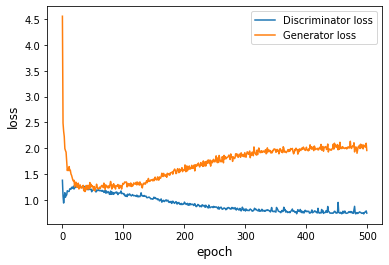

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch', size=12)
plt.ylabel('loss', size=12)
plt.legend(['Discriminator loss', 'Generator loss'])
plt.show()

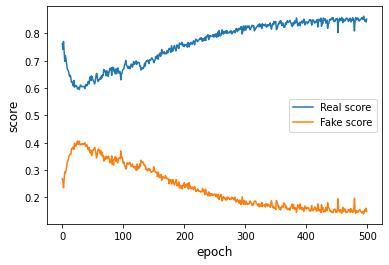

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch', size=12)
plt.ylabel('score', size=12)
plt.legend(['Real score', 'Fake score'])
plt.show()

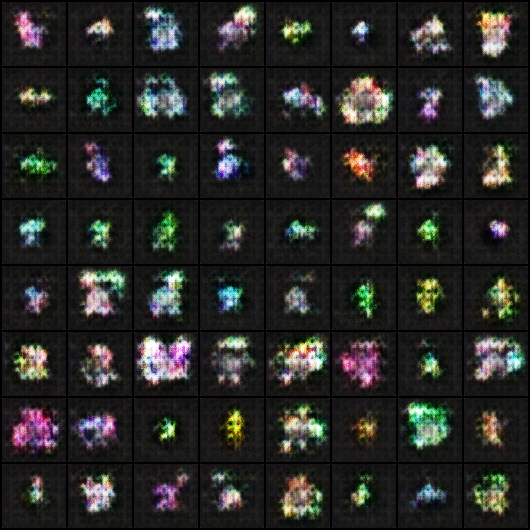

In [ ]:
Image('./generated/generated-images-0005.png')

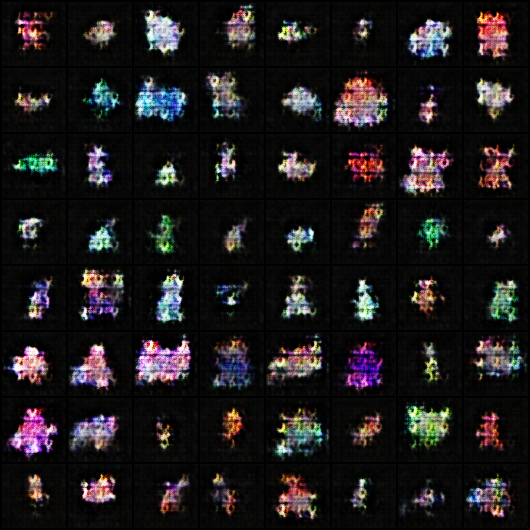

In [ ]:
Image('./generated/generated-images-0010.png')

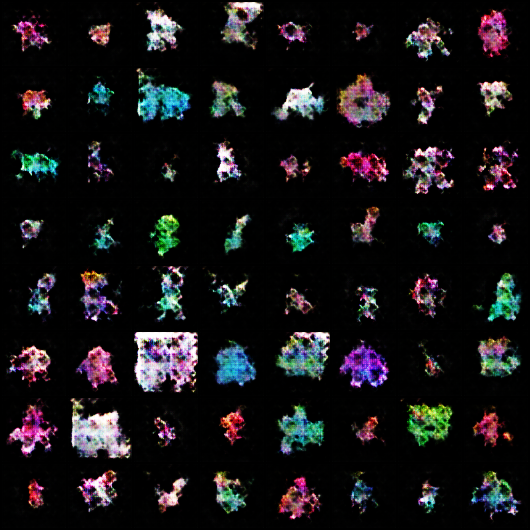

In [ ]:
Image('./generated/generated-images-0020.png')

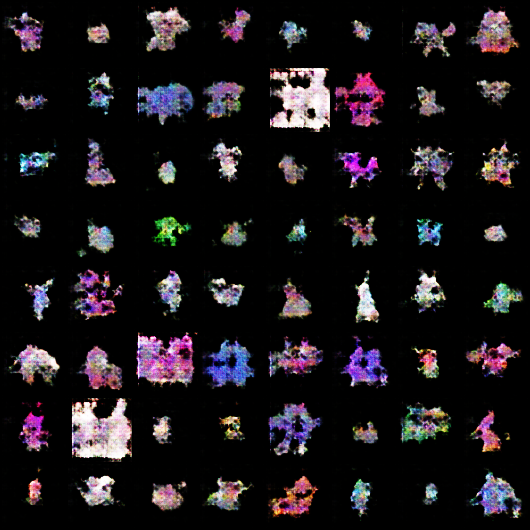

In [ ]:
Image('./generated/generated-images-0040.png')

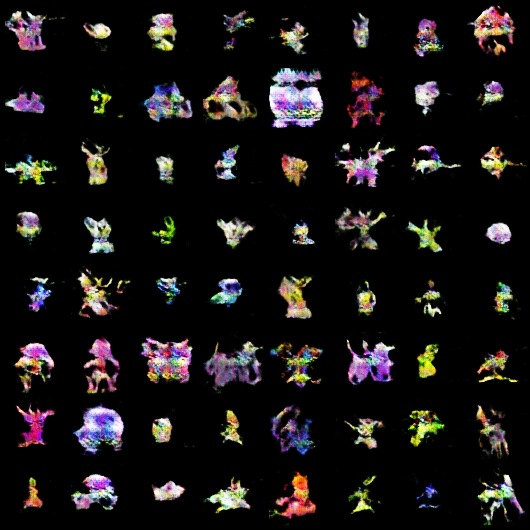

In [ ]:
Image('./generated/generated-images-0070.png')

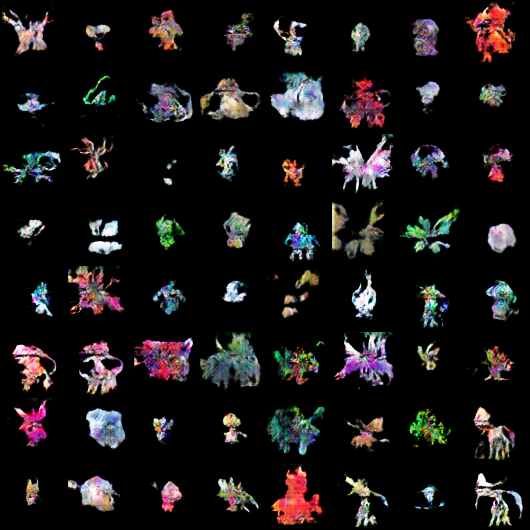

In [ ]:
Image('./generated/generated-images-0100.png')

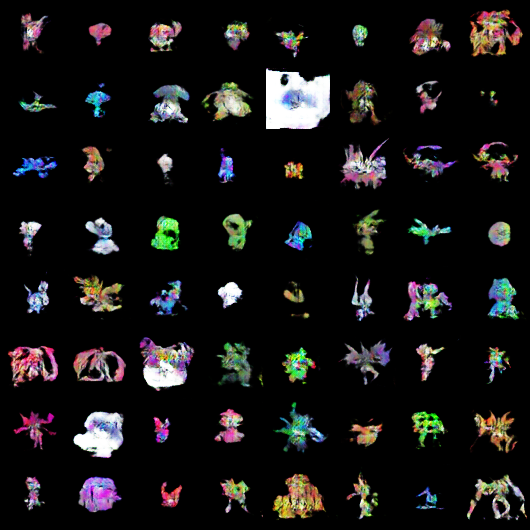

In [ ]:
Image('./generated/generated-images-0150.png')

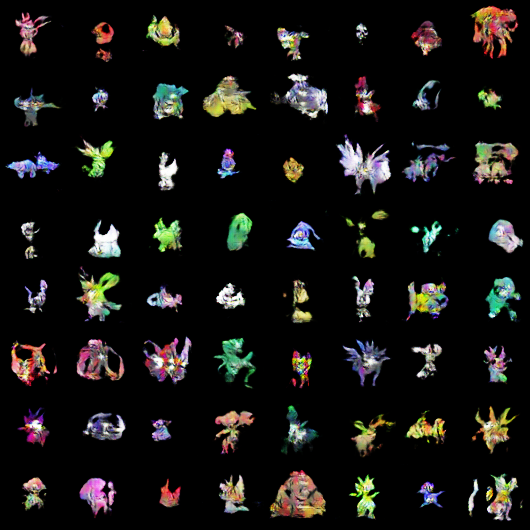

In [ ]:
Image('./generated/generated-images-0200.png')

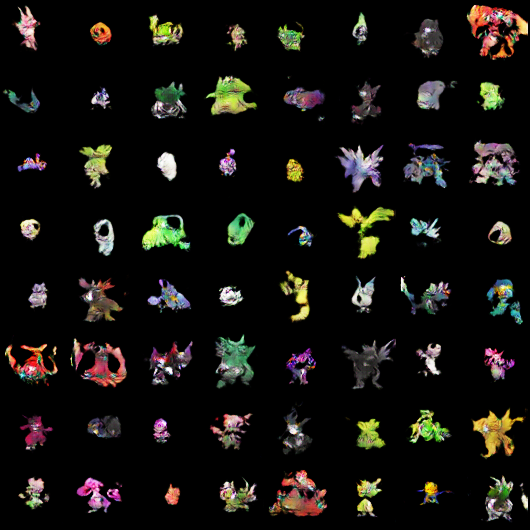

In [ ]:
Image('./generated/generated-images-0250.png')

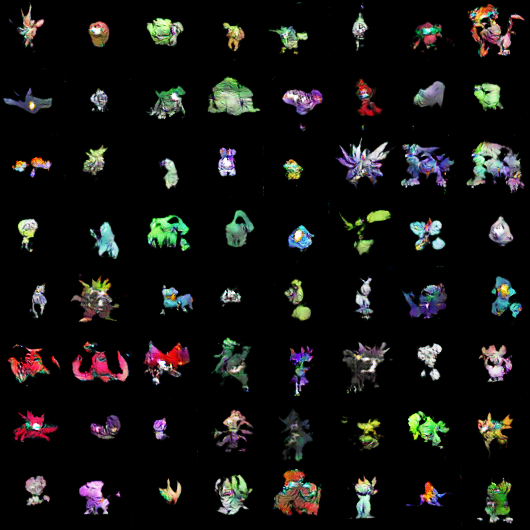

In [ ]:
Image('./generated/generated-images-0300.png')

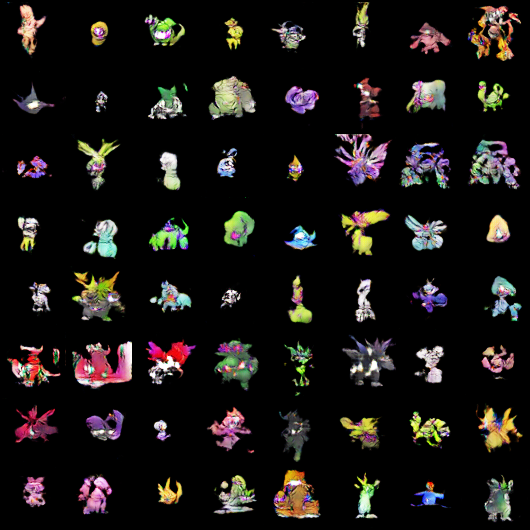

In [ ]:
Image('./generated/generated-images-0350.png')

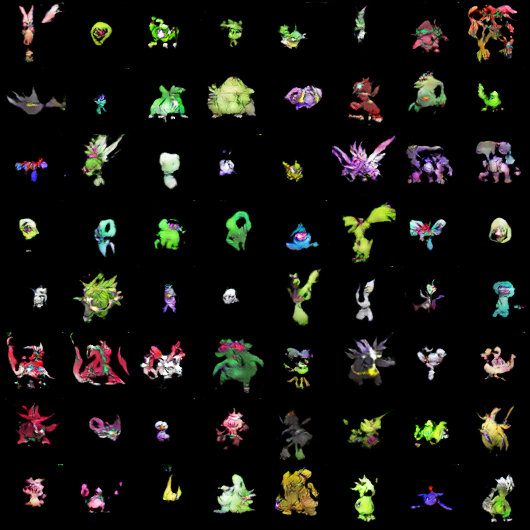

In [ ]:
Image('./generated/generated-images-0400.png')

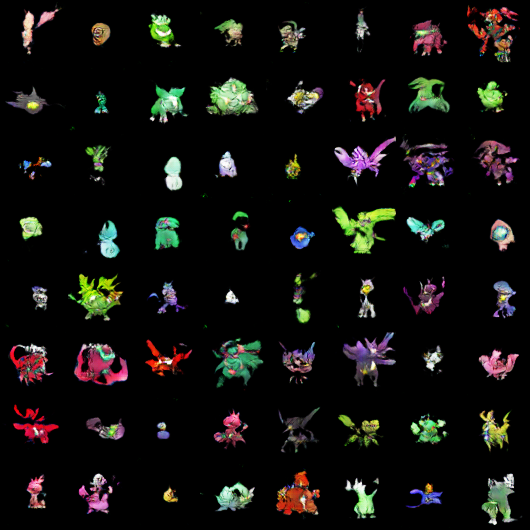

In [ ]:
Image('./generated/generated-images-0450.png')

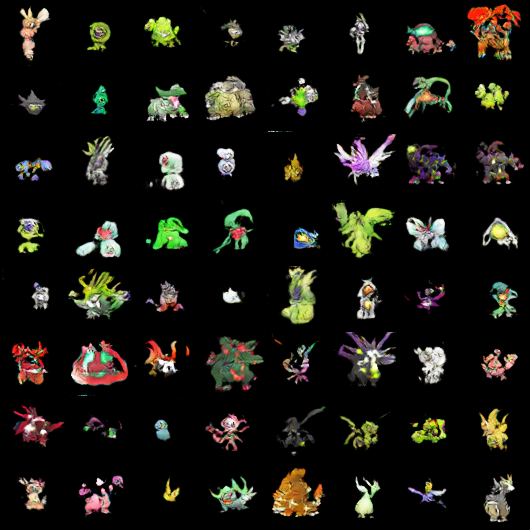

In [ ]:
Image('./generated/generated-images-0500.png')

In [ ]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

## Play with generator

In [ ]:
generator_trained = Generator().to(device)

In [ ]:
generator_trained.load_state_dict(torch.load("G.pth"))

<All keys matched successfully>

torch.Size([32, 3, 64, 64])


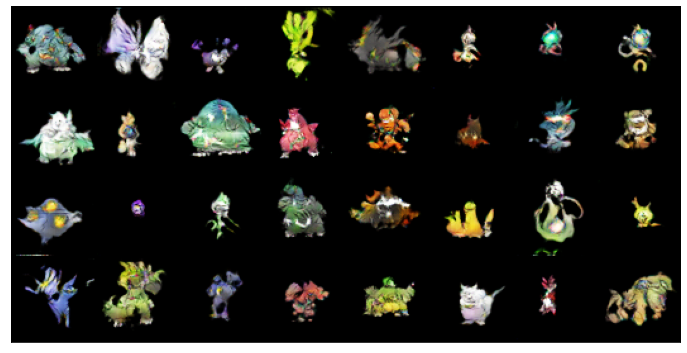

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1).to(device) # random latent tensors
fake_images = generator_trained(xb)
print(fake_images.shape)
show_images(fake_images.cpu())